In [ ]:
# load 5.2 convnet model
from tensorflow.keras.models import load_model

model = load_model('./cats_and_dogs_small_2.h5')
model.summary()

image shape: (1, 150, 150, 3)


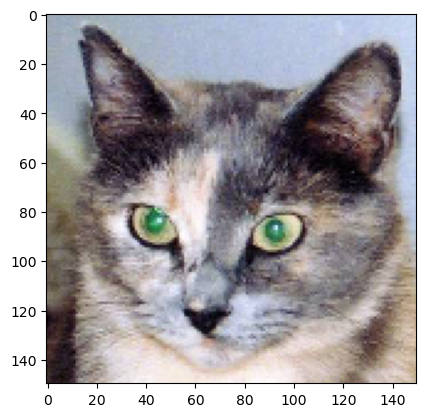

In [55]:
# select one image as input
import os
from tensorflow.keras.preprocessing import image
import numpy as np
import matplotlib.pyplot as plt

img_path = os.path.join(os.getcwd(), 'cats_and_dogs_small/test/cats/cat.1700.jpg')

img = image.load_img(img_path, target_size=(150, 150))
img_tensor = image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)
img_tensor /= 255

print('image shape:', img_tensor.shape)

plt.imshow(img_tensor[0])
plt.show()

first layer activation shape: (1, 148, 148, 32)


2022-08-24 03:13:55.052957: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


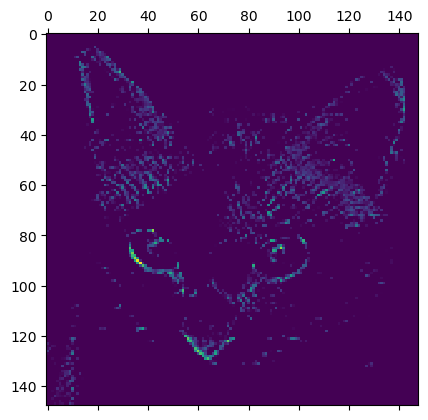

In [33]:
# input the image to the model and save the activation (output) of each layer
from tensorflow.keras import models

layer_outputs = [layer.output for layer in model.layers[:8]]
activation_model = models.Model(inputs=model.input, outputs=layer_outputs)

activations = activation_model.predict(img_tensor)

# visualize one feature channel of the first layer
l1_activation = activations[0]
print('first layer activation shape:', l1_activation.shape)
plt.matshow(l1_activation[0, :, :, 17], cmap='viridis')

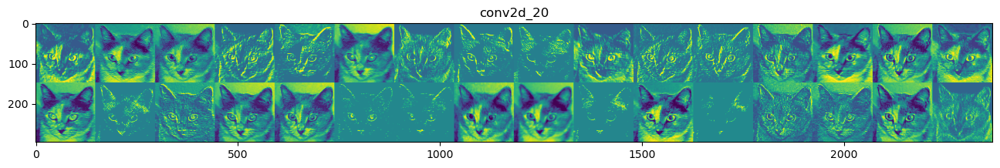

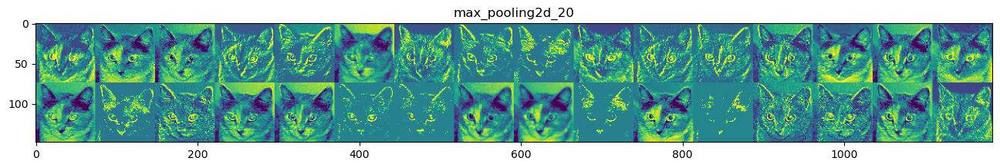

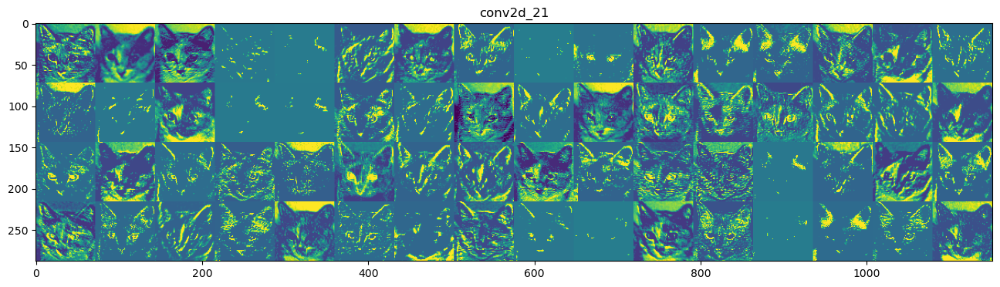

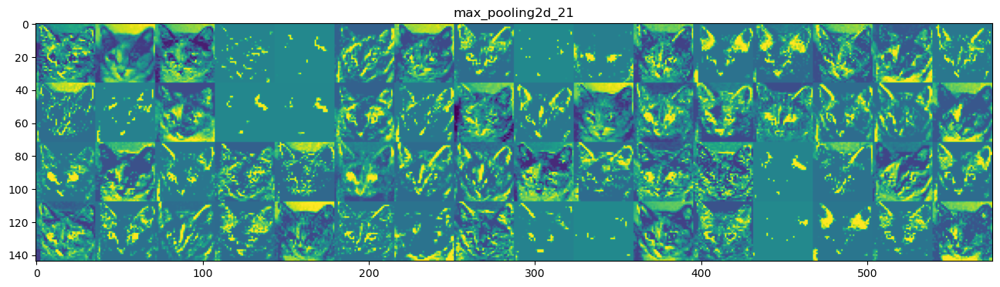

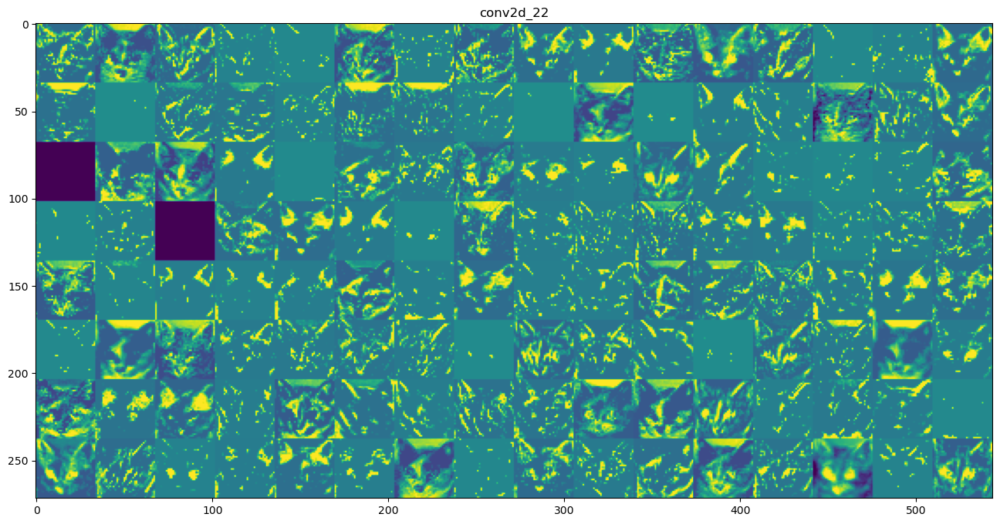

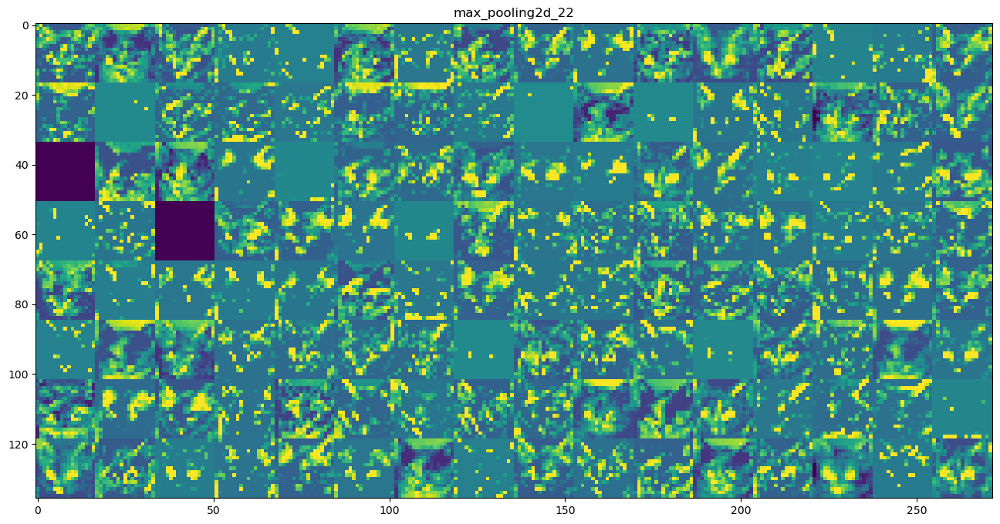

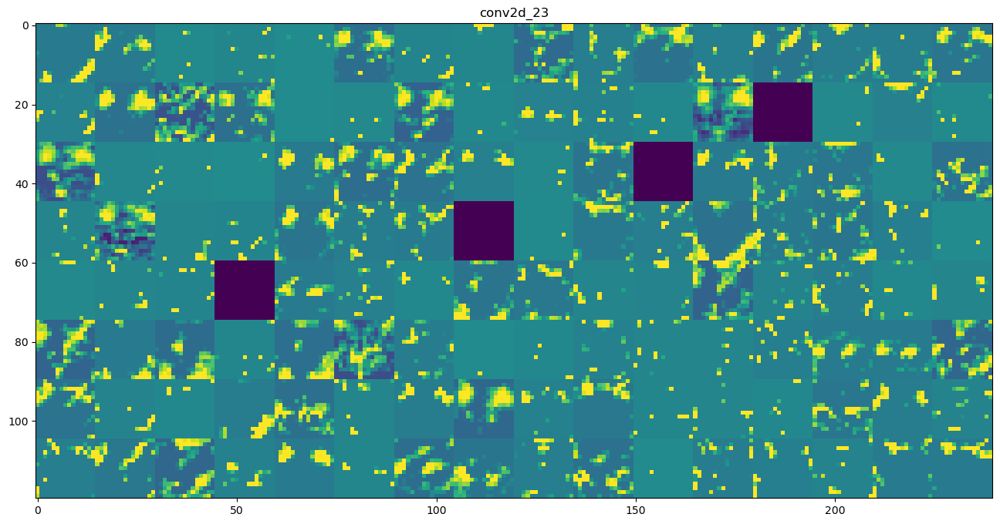

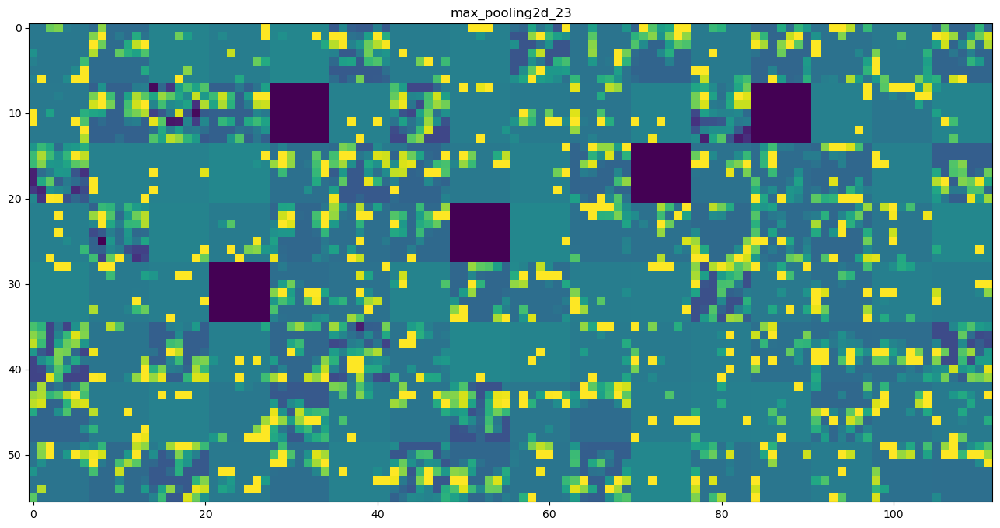

In [46]:
# visualize all channels for all activation
from math import ceil

layer_names = [layer.name for layer in model.layers[:8]]
images_per_row = 16

for layer_name, layer_activation in zip(layer_names, activations):
    n_features = layer_activation.shape[-1]
    size = layer_activation.shape[1]
    n_cols = ceil(n_features / images_per_row)
    display_grid = np.zeros((n_cols * size, images_per_row * size))
    for col in range(n_cols):
        for row in range(images_per_row):
            channel_image = layer_activation[0, :, :, 
                                             (col * images_per_row) + row]
            channel_image -= channel_image.mean()
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col+1) * size,
                         row * size : (row+1) * size] = channel_image
    scale = 1 / size
    plt.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')

In [28]:
# deprocess image tensor to display as RGB
def deprocess_image(image):
    # normalize image around 0 with std of 0.1
    image -= image.mean()
    image /= image.std() + 1e-5
    image *= 0.1
    
    # clip values to [0, 1]
    image += 0.5
    image = np.clip(image, 0, 1)
    
    # convert to RGB
    image *= 255
    image = np.clip(image, 0, 255).astype('uint8')
    return image

2022-08-26 04:02:43.060178: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.
2022-08-26 04:02:43.635369: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.
2022-08-26 04:02:44.070571: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.
2022-08-26 04:02:44.704306: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


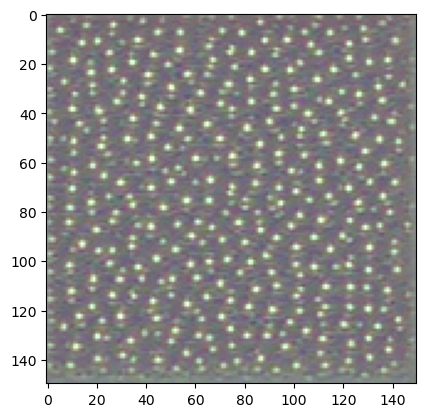

In [22]:
# visualize a convnet filter by displaying
# the input it maximally responds to
from tensorflow.keras.applications import VGG16
import tensorflow.keras.backend as K
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
tf.compat.v1.disable_eager_execution() # K.gradients is depreciated with eager execution

model = VGG16(weights='imagenet', include_top=False)

# use gradient ascent to find the input with maximal loss
# for a particular filter of a particular layer
def generate_pattern(layer_name, filter_index, size=150):
    layer_output = model.get_layer(layer_name).output
    loss = K.mean(layer_output[:, :, :, filter_index])

    grads = K.gradients(loss, model.input)[0]
    grads /= (K.sqrt(K.mean(K.square(grads))) + 1e-5) # divide graident by l2-norm

    iterate = K.function([model.input], [loss, grads])

    input_image = np.random.random((1, size, size, 3)) * 20 + 128 # noisy gray image

    # perform gradient ascent for 40 steps
    step = 1 # magnitude of gradient update
    for i in range(40):
        loss_val, grads_val = iterate(input_image)
        input_image += grads_val * step
    
    return deprocess_image(input_image[0])

img = generate_pattern('block3_conv1', 0)
plt.imshow(img)

2022-08-26 04:11:16.426468: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.
2022-08-26 04:11:18.075128: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.
2022-08-26 04:11:19.214628: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.
2022-08-26 04:11:21.280323: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.
2022-08-26 04:11:22.651601: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.
2022-08-26 04:11:24.584558: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.
2022-08-26 04:11:26.096173: I tensorflow/core/grappler/optimizers/cust

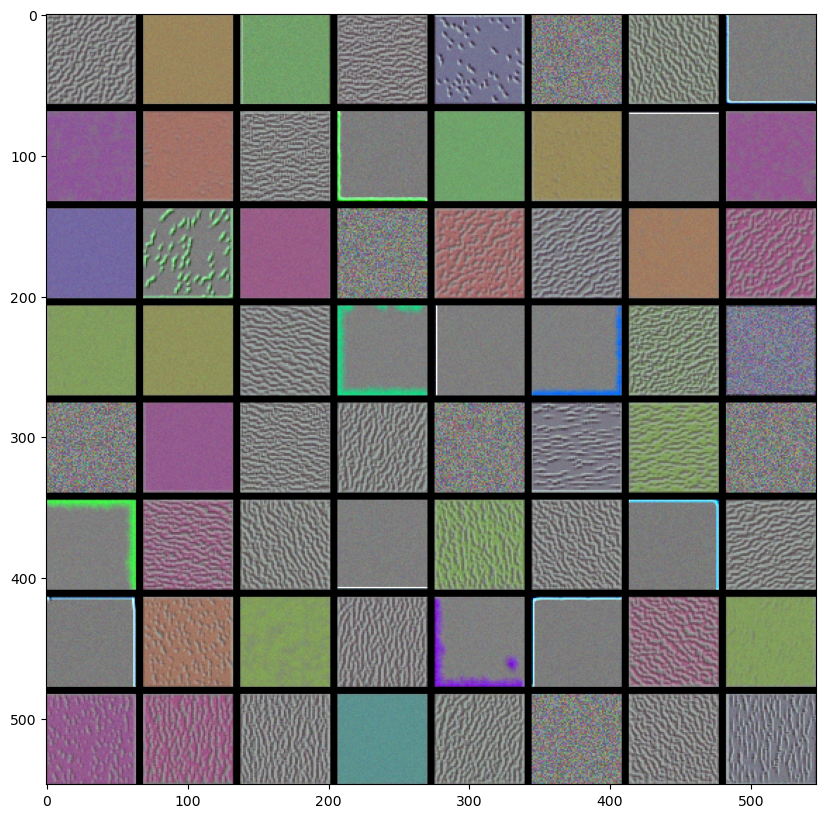

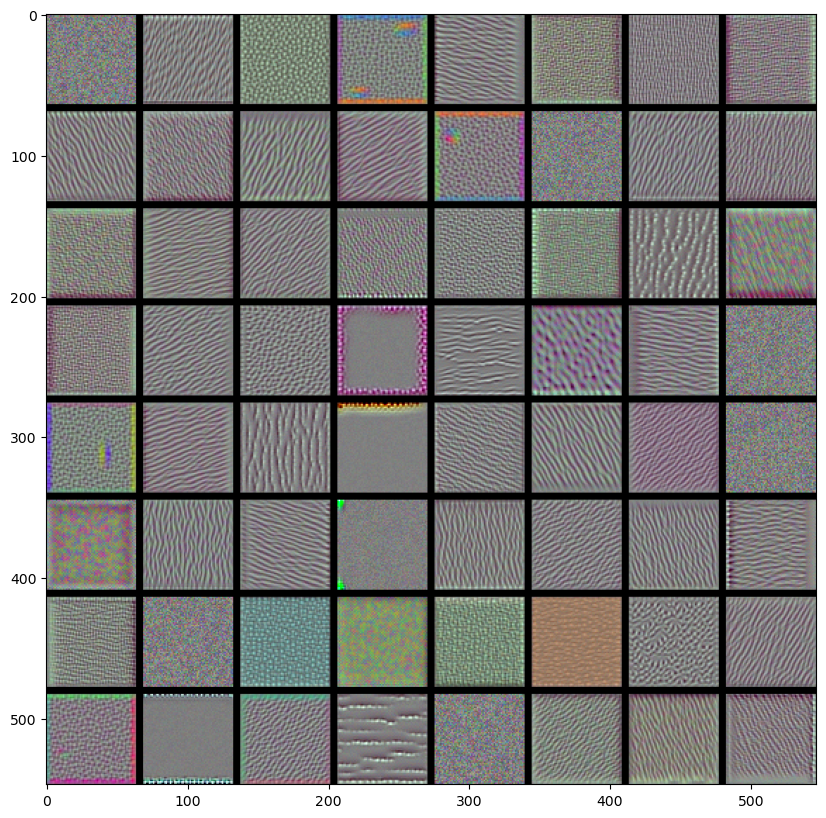

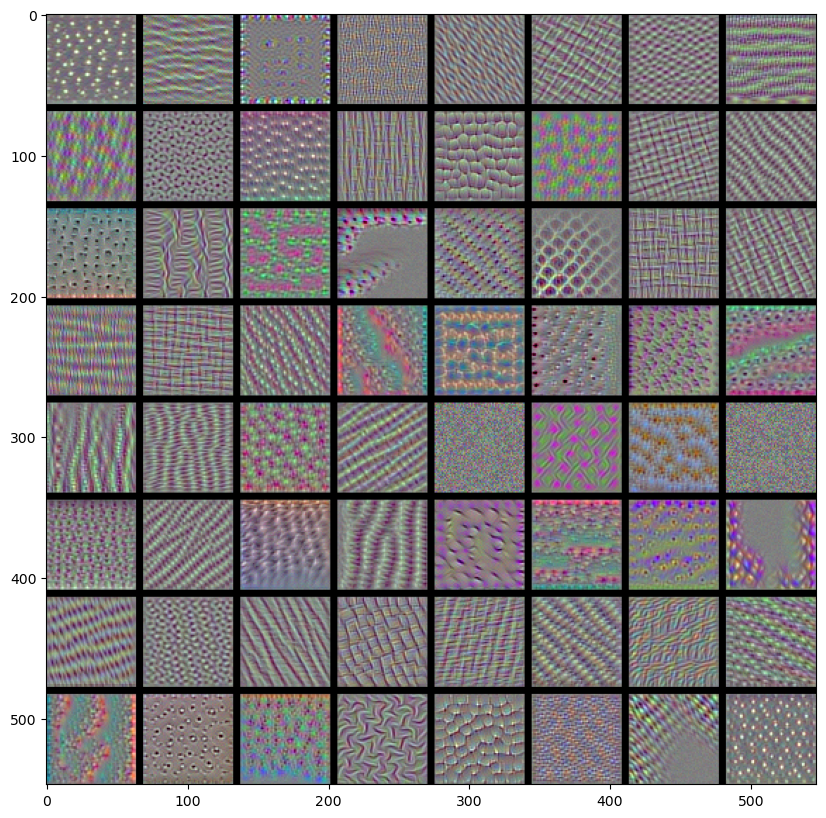

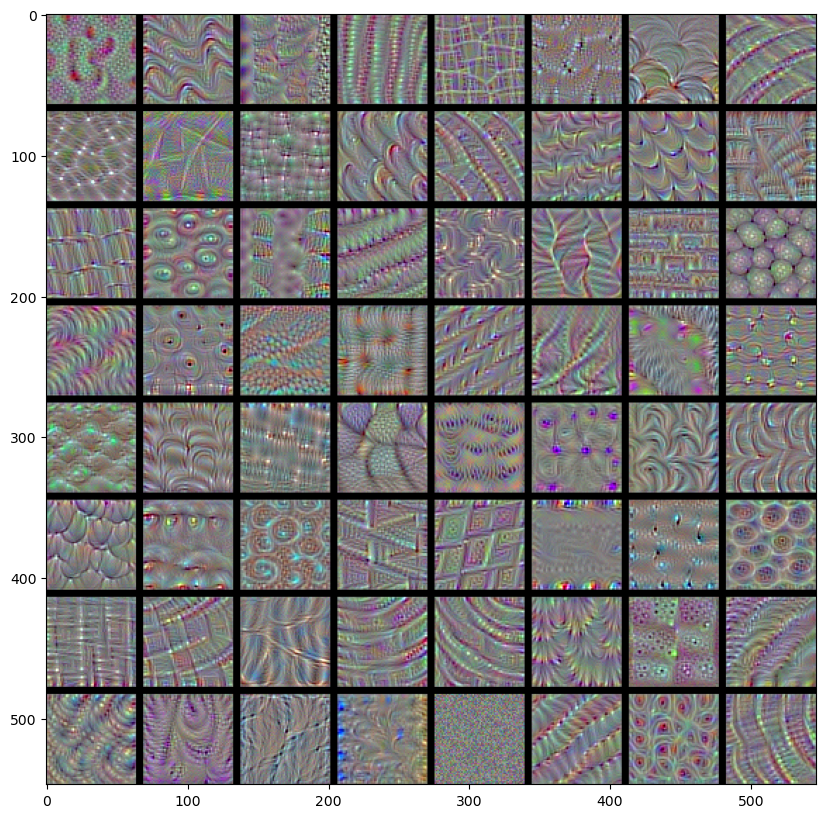

In [27]:
# generate a grid of filter response patterns
# for the first 64 filters of the first layer
# of each convolution block for VGG16
for layer_name in ['block1_conv1', 'block2_conv1', 'block3_conv1', 'block4_conv1']:
    size = 64
    margin = 5

    results = np.zeros(((8 * size) + (7 * margin), (8 * size) + (7 * margin), 3))

    for i in range(8):
        for j in range(8):
            filter_image = generate_pattern(layer_name, (i * 8) + j, size=size)
            
            horizontal_start = (i * size) + (i * margin)
            horizontal_end = horizontal_start + size
            vertical_start = (j * size) + (j * margin)
            vertical_end = vertical_start + size
            
            results[horizontal_start:horizontal_end,
                    vertical_start:vertical_end, :] = filter_image

    plt.figure(figsize=(10, 10))
    plt.imshow(results.astype('uint8'))

In [ ]:
# load full VGG16 model with dense classifier on top
from tensorflow.keras.applications.vgg16 import VGG16
model = VGG16(weights='imagenet')

In [8]:
# preprocess 'two elephants' image for VGG16
# (image from https://e360.yale.edu/assets/site/_1260xAUTO_stretch_center-center/elephant-gb7441f1a3_1920.jpg)
from base64 import decode
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.vgg16 import preprocess_input, decode_predictions
import numpy as np
import os

img_path = os.path.join(os.getcwd(), 'creative_commons_elephant.jpg')
img = image.load_img(img_path, target_size=(224, 224))
img_data = image.img_to_array(img)
img_data = np.expand_dims(img_data, axis=0)
img_data = preprocess_input(img_data)

# show model predictions for input image
preds = model.predict(img_data)

print('Predictions:', decode_predictions(preds, top=5)[0])
print('Top Prediction class index:', np.argmax(preds[0]))

Predictions: [('n02504458', 'African_elephant', 0.90942186), ('n01871265', 'tusker', 0.086182125), ('n02504013', 'Indian_elephant', 0.00435457), ('n02408429', 'water_buffalo', 3.9944352e-05), ('n02397096', 'warthog', 1.317179e-06)]
Top Prediction class index: 386


/opt/homebrew/Caskroom/miniforge/base/envs/tensorflow/lib/python3.9/site-packages/tensorflow/python/keras/engine/training.py:2426: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  warnings.warn('`Model.state_updates` will be removed in a future version. '
2022-08-28 00:26:51.454971: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


2022-08-28 00:26:53.254050: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


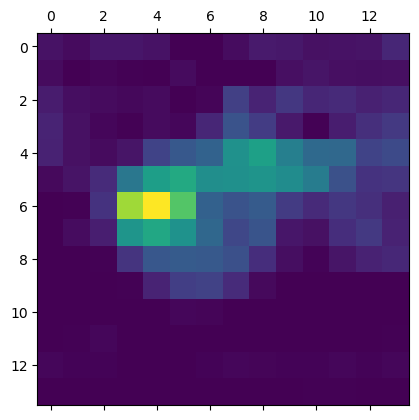

In [9]:
# generate class activation heatmap (Grad-CAM)
import matplotlib.pyplot as plt
import tensorflow.keras.backend as K
import tensorflow as tf
tf.compat.v1.disable_eager_execution() # K.gradients is depreciated with eager execution

african_elephant_output = model.output[:, 386]
last_conv_layer = model.get_layer('block5_conv3')

grads = K.gradients(african_elephant_output, last_conv_layer.output)[0]
pooled_grads = K.mean(grads, axis=(0, 1, 2))
iterate = K.function([model.input], [pooled_grads, last_conv_layer.output[0]])

pooled_grads_value, conv_layer_output_value = iterate([img_data])

for i in range(512):
    conv_layer_output_value[:, :, i] *= pooled_grads_value[i]

heatmap = np.mean(conv_layer_output_value, axis=-1)

heatmap = np.maximum(heatmap, 0)
heatmap /= np.max(heatmap)
plt.matshow(heatmap)

In [14]:
# overlay heatmap onto original image
import cv2
import os

img = cv2.imread(img_path)
heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
heatmap = np.uint8(255 * heatmap)
heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
superimposed_img = heatmap * 0.4 + img
dest_path = os.path.join(os.getcwd(), 'elephant_cam.jpg')
cv2.imwrite(dest_path, superimposed_img)

True